In [1]:
%config Completer.use_jedi = False

In [3]:
%matplotlib inline
import anndata
import scvelo as scv
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import os
import matplotlib
import matplotlib.pyplot as plt

In [4]:
import seaborn as sns

In [5]:
scv.set_figure_params()

In [6]:
scv.set_figure_params()
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['font.serif'] = ['Bitstream Vera Sans']

In [7]:
import sys
sys.path.append("/home/irina/tools/modules")

import visual

reds_cmap = beautiful_cmap()
blues_cmap = beautiful_cmap("Blues")
rb_cmap = beautiful_cmap("RdBu_r")

In [10]:
input_folder = "KCN_11/alignments/outs/filtered_feature_bc_matrix"

In [11]:
adata_egr_11 = sc.read_10x_mtx(input_folder)
adata_egr_11.obs["id"] = "Egr2_E11.5"
adata_egr_11.obs["age"] = "11.5" 
adata_egr_11.obs["lineage"] = "Egr2+" 

In [12]:
ldata_egr_11 = scv.read("KCN_11/alignments/velocyto/KCN_11.loom", cache = True)

In [13]:
prefix = 'Egr2_11:'

# Modify the index by adding the prefix and changing the suffix
new_index = [f'{prefix}{index}' for index in adata_egr_11.obs.index]
adata_egr_11.obs.index = new_index

new_index = [index.replace("KCN_11", "Egr2_11").replace("x","-1") for index in ldata_egr_11.obs.index]
ldata_egr_11.obs.index = new_index


In [14]:
adata_egr_11 = scv.utils.merge(adata_egr_11, ldata_egr_11)

In [15]:
adata_egr_11_raw = adata_egr_11.copy()

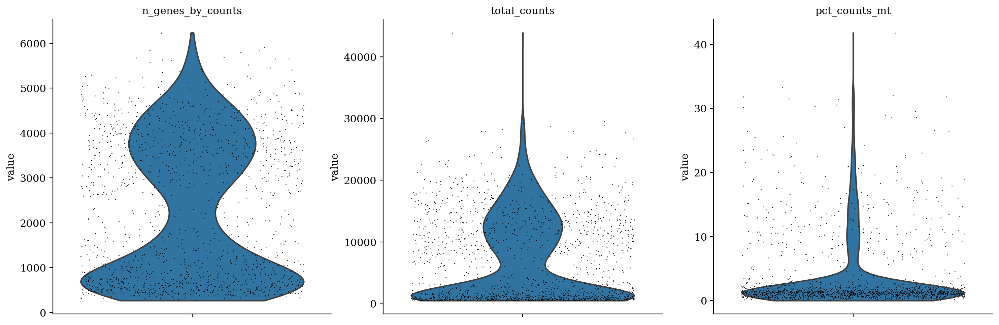

In [16]:
sc.pp.filter_cells(adata_egr_11, min_genes=200)
#sc.pp.filter_genes(adata_egr_11, min_cells=2)
adata_egr_11.var['mt'] = adata_egr_11.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_egr_11, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata_egr_11, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Automatically set threshold at doublet score = 0.36
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 8.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 2.4%


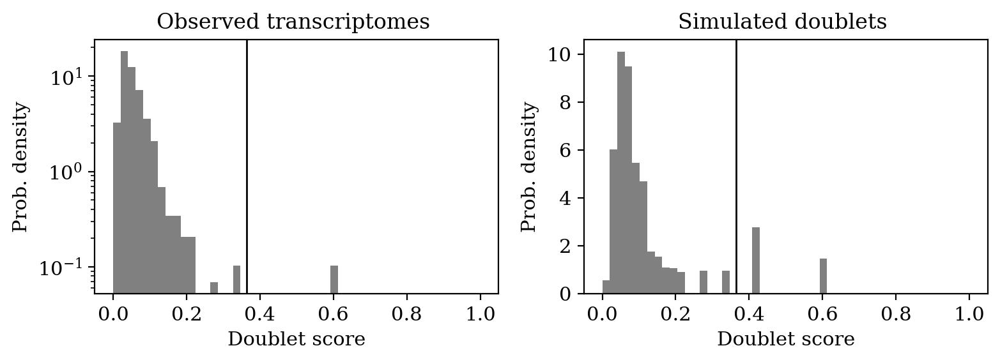

In [17]:
sc.external.pp.scrublet(adata_egr_11)
sc.external.pl.scrublet_score_distribution(adata_egr_11)


In [18]:
#sc.pp.filter_cells(adata_egr_11, max_counts = 60000)
adata_egr_11 = adata_egr_11[adata_egr_11.obs['n_genes_by_counts'] > 2000]
#adata_egr_11 = adata_egr_11[adata_egr_11.obs['n_genes_by_counts'] < 5500]
adata_egr_11 = adata_egr_11[adata_egr_11.obs['pct_counts_mt'] < 10]
adata_egr_11 = adata_egr_11[adata_egr_11.obs['doublet_score'] < 0.2]

In [19]:
sc.pp.normalize_total(adata_egr_11, target_sum=1e4)
sc.pp.log1p(adata_egr_11)
sc.pp.highly_variable_genes(adata_egr_11, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata_egr_11.raw = adata_egr_11
sc.pp.scale(adata_egr_11, max_value=10)

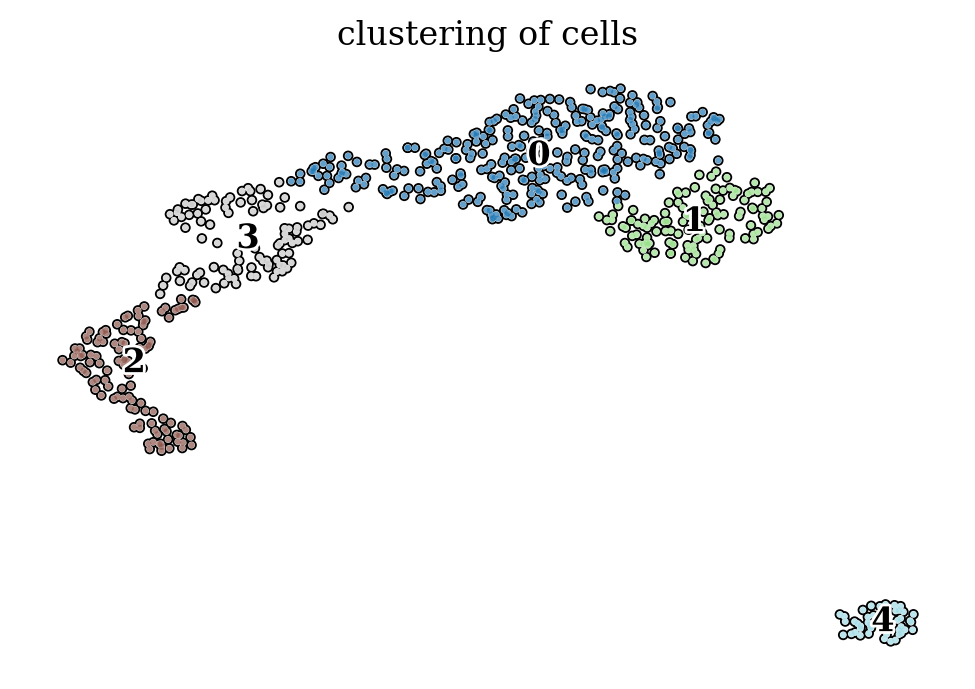

In [20]:
sc.tl.pca(adata_egr_11, svd_solver='arpack', n_comps = 50)
sc.pp.neighbors(adata_egr_11, n_neighbors=40, n_pcs = 15)
sc.tl.leiden(adata_egr_11, resolution = .2)
sc.tl.umap(adata_egr_11)

sc.pl.umap(adata_egr_11, color = ["leiden"], add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False, size = 20,
               title='clustering of cells', palette='tab20')



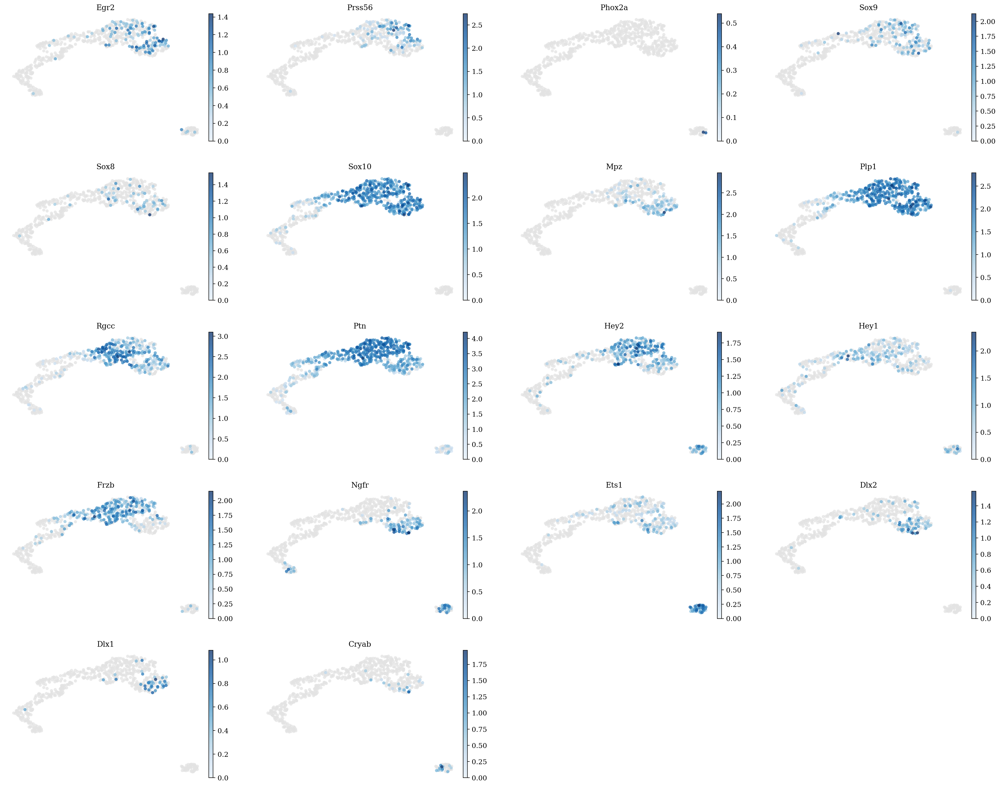

In [21]:
sc.pl.umap(adata_egr_11, color = ["Egr2", "Prss56", "Phox2a", "Sox9", "Sox8", "Sox10", "Mpz", "Plp1",
                                 "Rgcc", "Ptn", "Hey2", "Hey1", "Frzb",
                                 "Ngfr", "Ets1", "Dlx2", "Dlx1", "Cryab"], color_map = blues_cmap, frameon = False, size = 100, alpha = .75)

# no Dbh, Phox2b, Phox2a

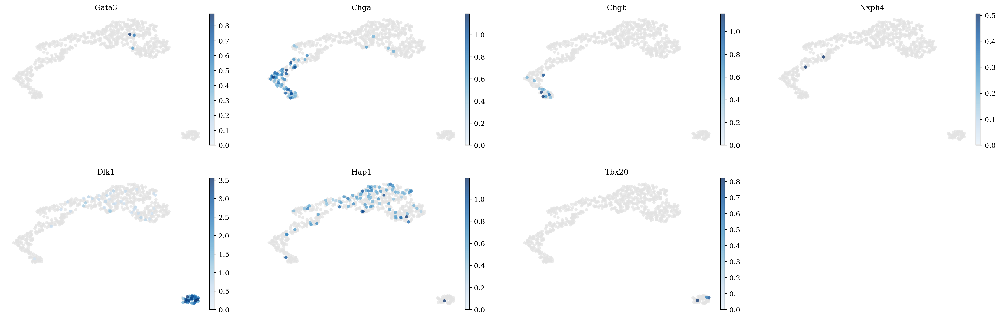

In [22]:
sc.pl.umap(adata_egr_11, color = ["Gata3", "Chga", "Chgb", "Nxph4", "Dlk1", "Hap1", "Tbx20"], color_map = blues_cmap, frameon = False, size = 100, alpha = .75)


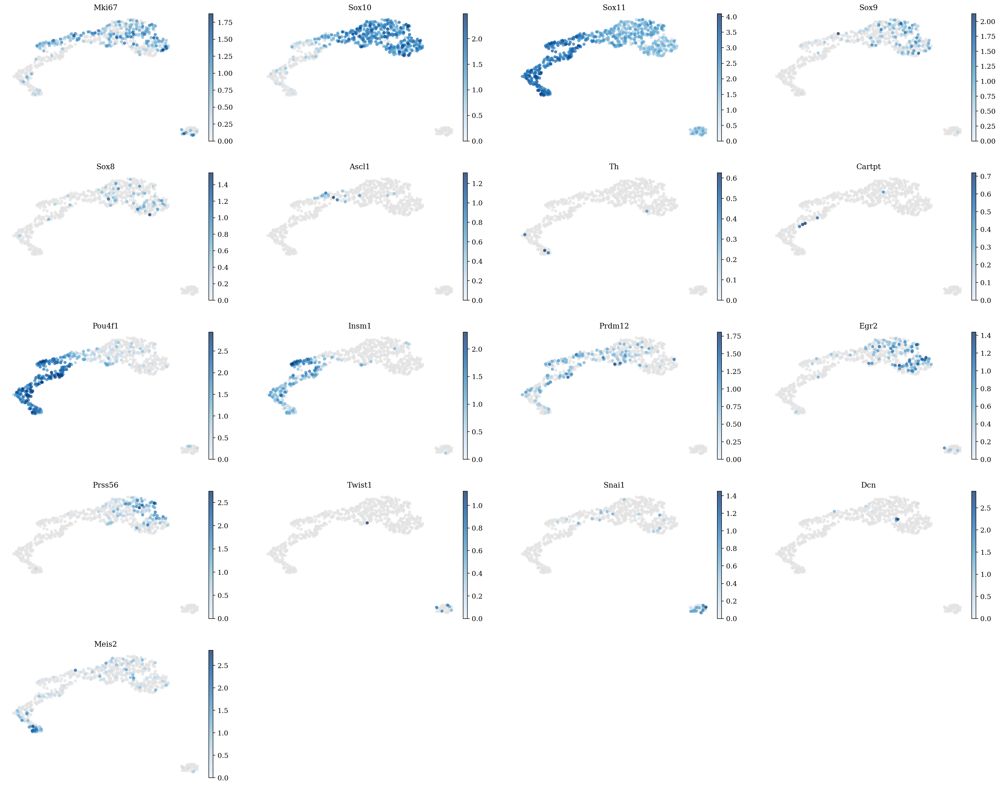

In [23]:
sc.pl.umap(adata_egr_11, color = ["Mki67", "Sox10", "Sox11", "Sox9", "Sox8", "Ascl1", "Th",
                                 "Cartpt", "Pou4f1", "Insm1", "Prdm12", "Egr2", "Prss56", 
                                 "Twist1", "Snai1", "Dcn", "Meis2"], color_map = blues_cmap, frameon = False, size = 100, alpha = .75)

# no Dbh, Phox2b, Phox2a

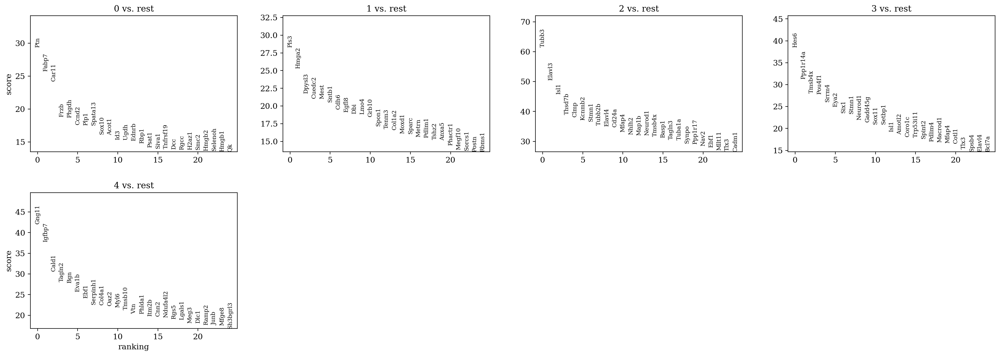

In [25]:
sc.tl.rank_genes_groups(adata_egr_11, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata_egr_11, n_genes=25, sharey=False)

In [26]:
adata_egr_11

AnnData object with n_obs × n_vars = 695 × 33207
    obs: 'id', 'age', 'lineage', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'leiden'
    var: 'gene_ids', 'feature_types', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'scrublet', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [27]:
adata = adata_egr_11.copy()

In [28]:
adata = adata[adata.obs['leiden'].isin(["0", "1", "2", "3"]),:].copy() 

In [29]:
adata_egr_11_raw = adata_egr_11_raw[adata.obs_names]
adata_egr_11_raw.obs = adata.obs

In [30]:
adata_egr_11_to_integrate = adata.copy() 


# Egr2+ lineage (E12)

In [31]:
input_folder = "KCN_12/alignments/KCN_12/outs/filtered_feature_bc_matrix"

adata_egr_12 = sc.read_10x_mtx(input_folder)
adata_egr_12.obs["id"] = "Egr2_E12.5"
adata_egr_12.obs["age"] = "12.5" 
adata_egr_12.obs["lineage"] = "Egr2+" 

ldata_egr_12 = scv.read("KCN_12/alignments/KCN_12/velocyto/KCN_12.loom", cache = True)

prefix = 'Egr2_12:'

# Modify the index by adding the prefix and changing the suffix
new_index = [f'{prefix}{index}' for index in adata_egr_12.obs.index]
adata_egr_12.obs.index = new_index

new_index = [index.replace("KCN_12", "Egr2_12").replace("x","-1") for index in ldata_egr_12.obs.index]
ldata_egr_12.obs.index = new_index

adata_egr_12 = scv.utils.merge(adata_egr_12, ldata_egr_12)
adata_egr_12_raw = adata_egr_12.copy()

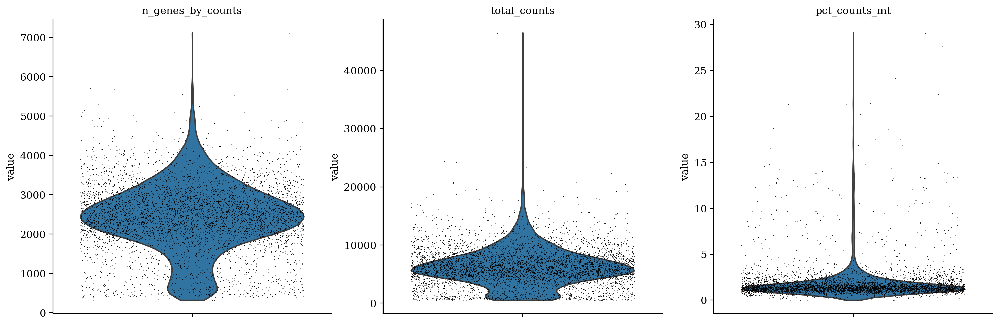

Automatically set threshold at doublet score = 0.27
Detected doublet rate = 2.0%
Estimated detectable doublet fraction = 46.0%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.3%


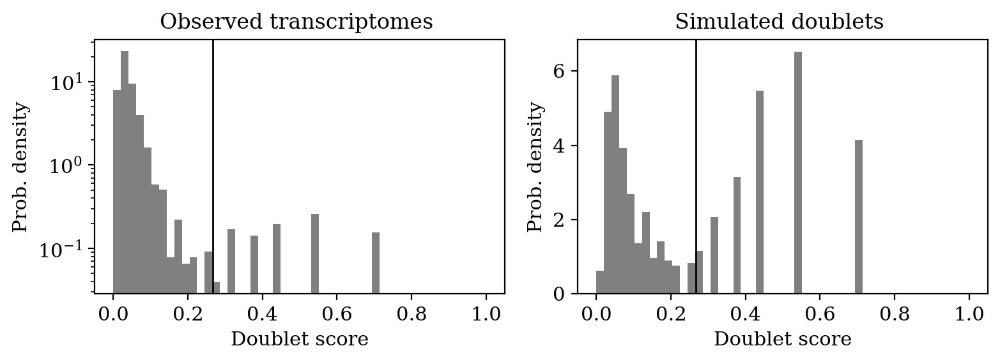

In [32]:
sc.pp.filter_cells(adata_egr_12, min_genes=200)
#sc.pp.filter_genes(adata_egr_12, min_cells=2)
adata_egr_12.var['mt'] = adata_egr_12.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_egr_12, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata_egr_12, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

sc.external.pp.scrublet(adata_egr_12)
sc.external.pl.scrublet_score_distribution(adata_egr_12)



In [33]:
adata_egr_12 = adata_egr_12[adata_egr_12.obs['n_genes_by_counts'] > 1000]
adata_egr_12 = adata_egr_12[adata_egr_12.obs['pct_counts_mt'] < 10]
adata_egr_12 = adata_egr_12[adata_egr_12.obs['doublet_score'] < 0.2]



In [34]:
sc.pp.normalize_total(adata_egr_12, target_sum=1e4)
sc.pp.log1p(adata_egr_12)
sc.pp.highly_variable_genes(adata_egr_12, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata_egr_12.raw = adata_egr_12
sc.pp.scale(adata_egr_12, max_value=10)


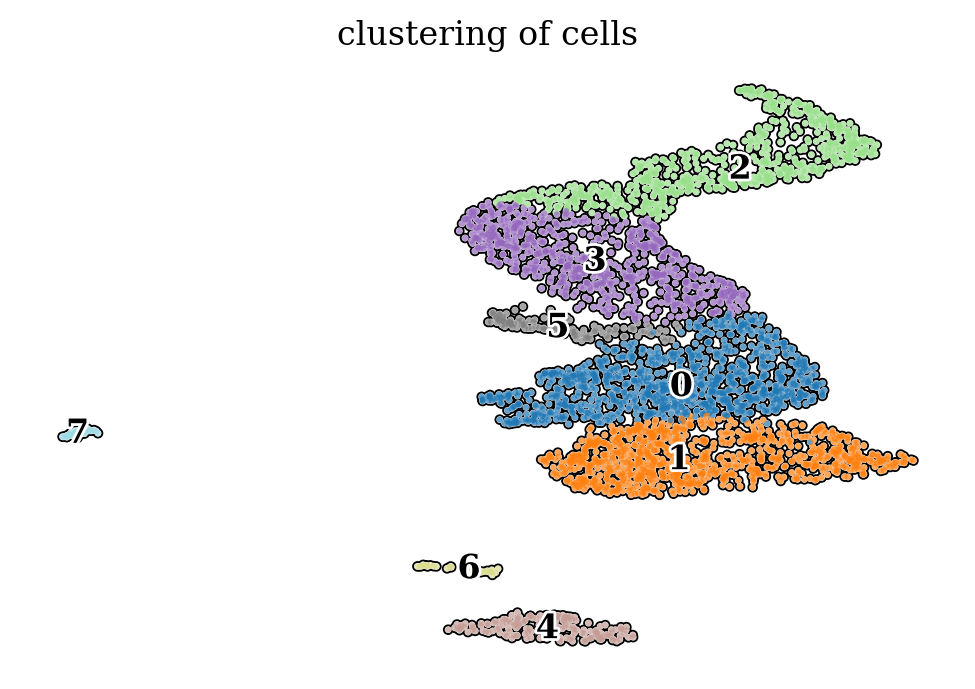

In [35]:
sc.tl.pca(adata_egr_12, svd_solver='arpack', n_comps = 50)
sc.pp.neighbors(adata_egr_12, n_neighbors=40, n_pcs = 15)
sc.tl.leiden(adata_egr_12, resolution = .2)
sc.tl.umap(adata_egr_12)

sc.pl.umap(adata_egr_12, color = ["leiden"], add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False, size = 20,
               title='clustering of cells', palette='tab20')


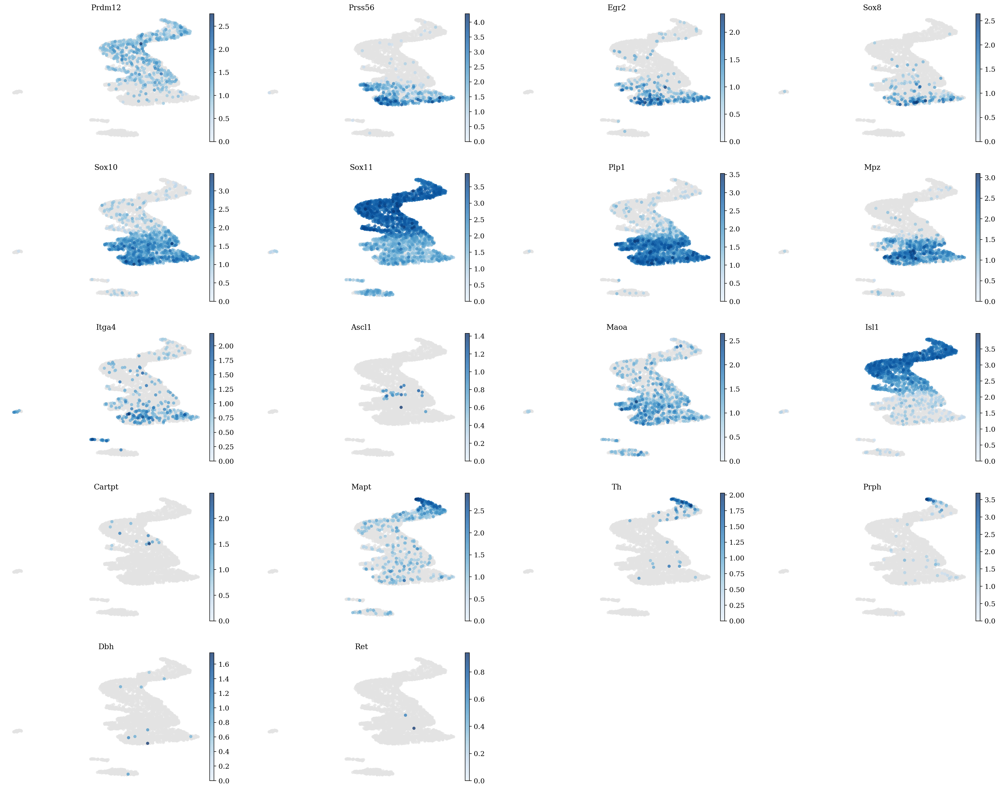

In [37]:
sc.pl.umap(adata_egr_12, color = ["Prdm12", "Prss56", "Egr2", "Sox8", "Sox10", "Sox11", "Plp1", "Mpz", "Itga4", "Ascl1",
"Maoa", "Isl1", "Cartpt", "Mapt", "Th", "Prph", "Dbh", "Ret"], color_map = blues_cmap, frameon = False, size = 100, alpha = .75)
# no Dbh, Phox2b, Phox2a

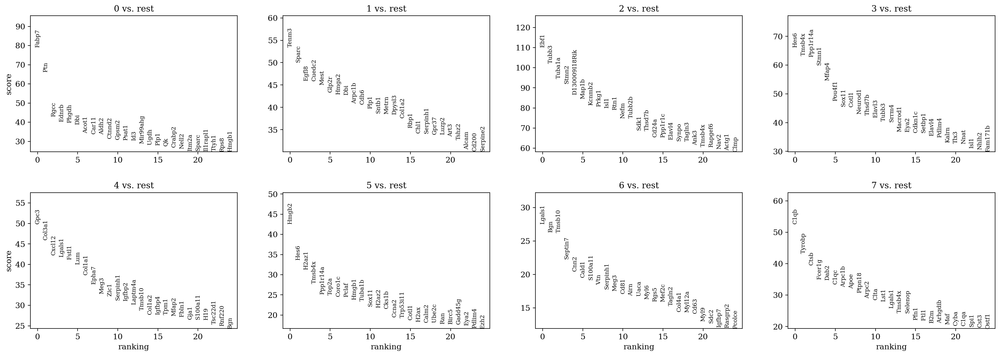

In [39]:
sc.tl.rank_genes_groups(adata_egr_12, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata_egr_12, n_genes=25, sharey=False)

In [40]:
adata = adata_egr_12.copy()
adata = adata[adata.obs['leiden'].isin(["0", "1", "2", "3", "5"]),:].copy() 

In [41]:
adata_egr_12_raw = adata_egr_12_raw[adata.obs_names]
adata_egr_12_raw.obs = adata.obs

In [42]:
adata_egr_12_to_integrate = adata.copy() 


# Prss56+ lineage

In [43]:
input_folder = "Prss_E12/alignments/Prss_E12/outs/filtered_feature_bc_matrix"

adata_prss_12 = sc.read_10x_mtx(input_folder)
adata_prss_12.obs["id"] = "Prss56_E12.5"
adata_prss_12.obs["age"] = "12.5" 
adata_prss_12.obs["lineage"] = "Prss56+"

ldata_prss_12 = scv.read("Prss_E12/alignments/Prss_E12/velocyto/Prss_E12.loom", cache = True)

prefix = 'Prss56_12:'

# Modify the index by adding the prefix and changing the suffix
adata_prss_12.obs.index = [f'{prefix}{index}' for index in adata_prss_12.obs.index]
ldata_prss_12.obs.index = ["Prss56_12:" + i.split(":")[1][:-1] + "-1" for i in ldata_prss_12.obs.index]

for layer in ldata_prss_12.layers.keys():
    adata_prss_12.layers[layer] = ldata_prss_12[adata_prss_12.obs_names].layers[layer].copy()
    
adata_prss_12_raw = adata_prss_12.copy()

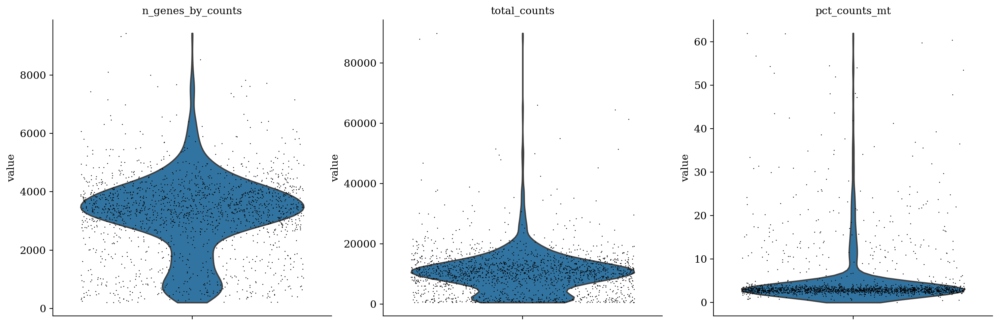

Automatically set threshold at doublet score = 0.24
Detected doublet rate = 1.7%
Estimated detectable doublet fraction = 41.6%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.0%


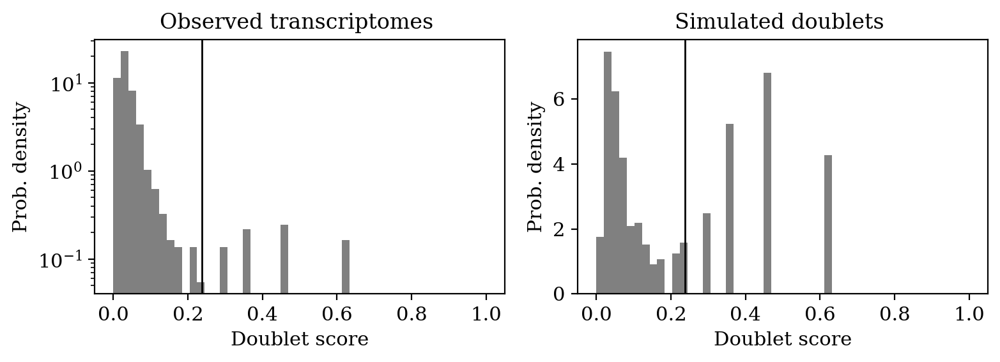

In [44]:
sc.pp.filter_cells(adata_prss_12, min_genes=200)
#sc.pp.filter_genes(adata_prss_12, min_cells=2)
adata_prss_12.var['mt'] = adata_prss_12.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_prss_12, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata_prss_12, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

sc.external.pp.scrublet(adata_prss_12)
sc.external.pl.scrublet_score_distribution(adata_prss_12)


In [45]:
adata_prss_12 = adata_prss_12[adata_prss_12.obs['n_genes_by_counts'] > 2000]
adata_prss_12 = adata_prss_12[adata_prss_12.obs['pct_counts_mt'] < 10]
adata_prss_12 = adata_prss_12[adata_prss_12.obs['doublet_score'] < 0.2]


In [46]:
sc.pp.normalize_total(adata_prss_12, target_sum=1e4)
sc.pp.log1p(adata_prss_12)
sc.pp.highly_variable_genes(adata_prss_12, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata_prss_12.raw = adata_prss_12
sc.pp.scale(adata_prss_12, max_value=10)


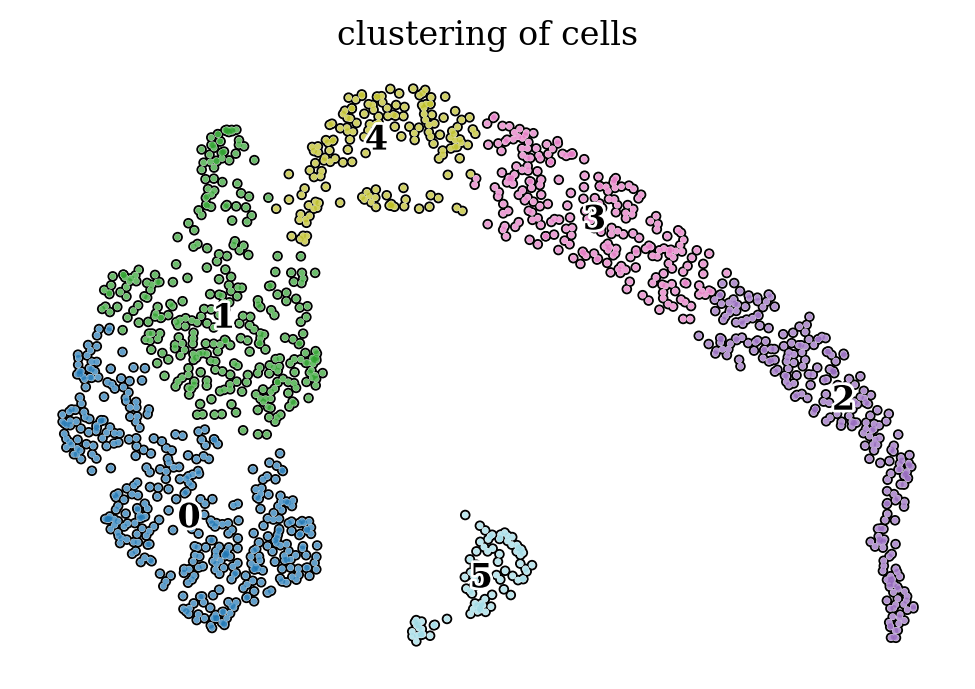

In [47]:
sc.tl.pca(adata_prss_12, svd_solver='arpack', n_comps = 50)
sc.pp.neighbors(adata_prss_12, n_neighbors=40, n_pcs = 15)
sc.tl.leiden(adata_prss_12, resolution = .2)
sc.tl.umap(adata_prss_12)

sc.pl.umap(adata_prss_12, color = ["leiden"], add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False, size = 20,
               title='clustering of cells', palette='tab20')



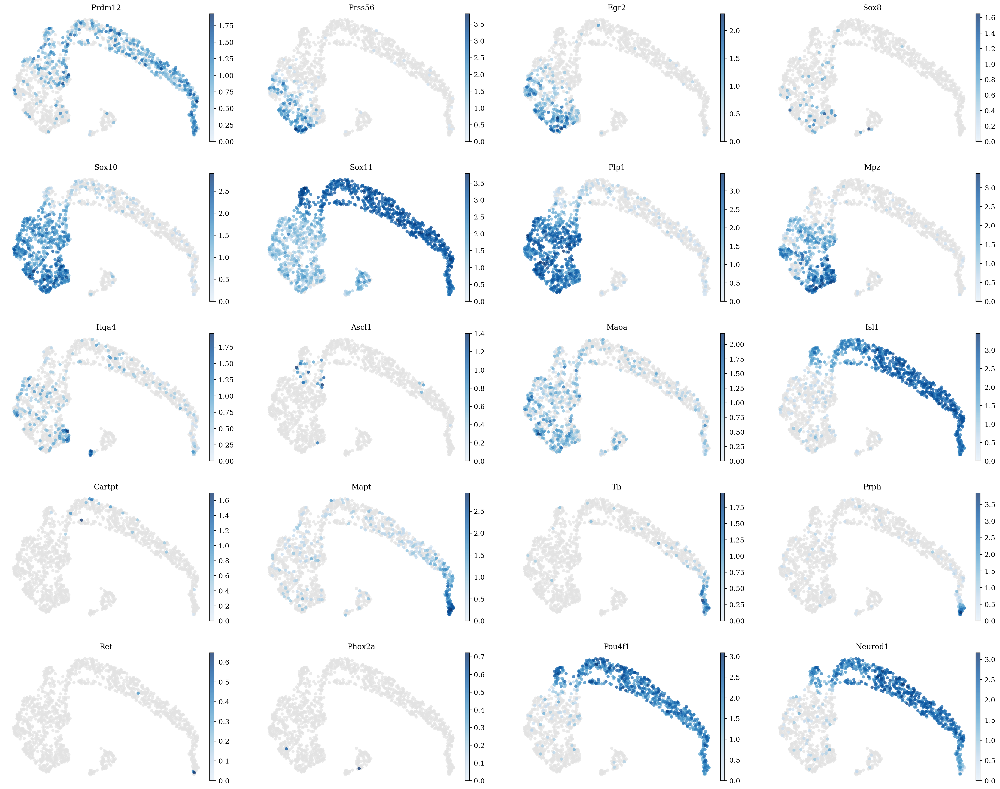

In [49]:
sc.pl.umap(adata_prss_12, color = ["Prdm12", "Prss56", "Egr2", "Sox8", "Sox10", "Sox11", "Plp1", "Mpz", "Itga4", "Ascl1",
"Maoa", "Isl1", "Cartpt", "Mapt", "Th", "Prph", "Ret", "Phox2a", "Pou4f1", "Neurod1"], color_map = blues_cmap, frameon = False, size = 100, alpha = .75)


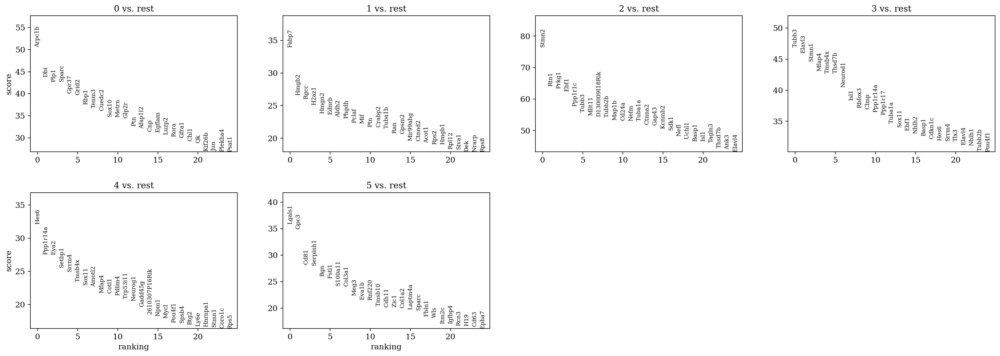

In [50]:
sc.tl.rank_genes_groups(adata_prss_12, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata_prss_12, n_genes=25, sharey=False)

In [52]:
adata = adata_prss_12.copy()
adata = adata[adata.obs['leiden'].isin(["0", "1", "2", "3", "4"]),:].copy() 
adata_prss_to_integrate = adata.copy() 


In [53]:
adata_prss_12_raw = adata_prss_12_raw[adata.obs_names]
adata_prss_12_raw.obs = adata.obs

## Integration

In [54]:
import scanpy.external as sce

adata_j = anndata.concat(
    [adata_egr_11_raw, adata_egr_12_raw, adata_prss_12_raw],
    join = "outer",
)

sc.pp.normalize_total(adata_j, target_sum=1e4)
sc.pp.log1p(adata_j)
sc.pp.highly_variable_genes(adata_j, n_top_genes=3000, batch_key="id")

adata_j.raw = adata_j
adata_j.layers["scaled"] = sc.pp.scale(adata_j, max_value=10, copy=True).X

adata_j.obsm["X_pca"] = sc.pp.pca(adata_j[:, adata_j.var.highly_variable].layers["scaled"], n_comps=30)
sce.pp.harmony_integrate(adata_j, key="id", max_iter_harmony=30)
sc.pp.neighbors(adata_j, use_rep="X_pca_harmony")
sc.tl.umap(adata_j)
sc.tl.leiden(adata_j, resolution=1.3)


2024-03-08 17:39:14,671 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-03-08 17:39:16,502 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-03-08 17:39:16,603 - harmonypy - INFO - Iteration 1 of 30
2024-03-08 17:39:19,442 - harmonypy - INFO - Iteration 2 of 30
2024-03-08 17:39:21,948 - harmonypy - INFO - Iteration 3 of 30
2024-03-08 17:39:24,492 - harmonypy - INFO - Iteration 4 of 30
2024-03-08 17:39:26,704 - harmonypy - INFO - Iteration 5 of 30
2024-03-08 17:39:29,217 - harmonypy - INFO - Converged after 5 iterations


In [61]:
cluster_dict = {'0':"BCC", '1':"SCPs", '2':"non-proliferating neurogenesis", '3':"satellite glial cells", 
                '4':"SCPs", '5':"non-proliferating neurogenesis", '6':"non-proliferating neurogenesis", '7':"BCC", '8':"non-proliferating neurogenesis", 
                '9':"non-proliferating neurogenesis", '10':"BCC", '11':"non-proliferating neurogenesis", '12':"BCC",
                '13':"autonomic priming", '14':"proliferating neurogenesis", '15':"non-proliferating neurogenesis", 
                '16':"non-proliferating neurogenesis", 
                '17':"BCC", '18':"non-proliferating neurogenesis", '19':"BCC"}

adata_j.obs['celltype'] = adata_j.obs['leiden_res_1'].map(cluster_dict)

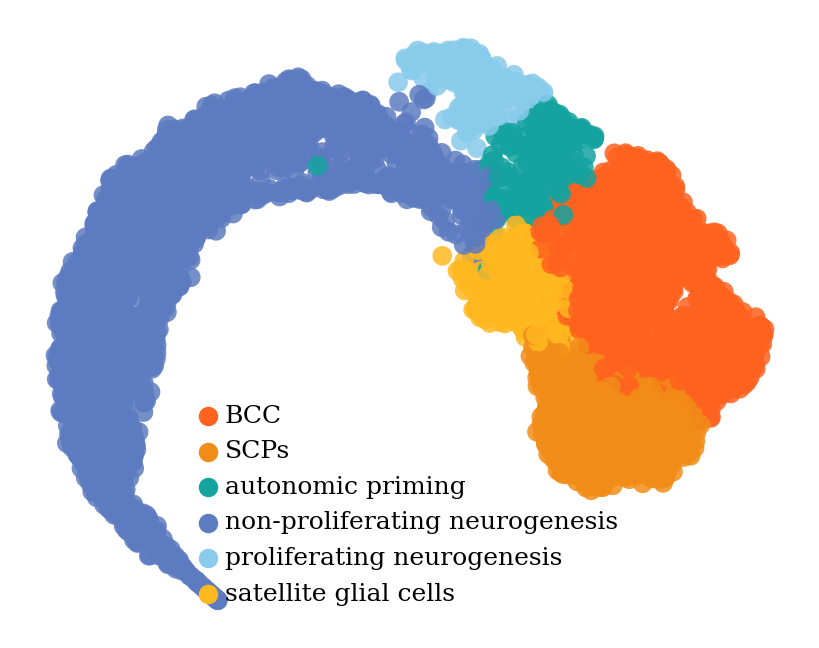

In [63]:
adata_j.uns["celltype_colors"] = ["#FF621F", "#F28C18", "#14A39F", "#5D7BC0", "#88cbeb", "#FFB81F"]
scv.pl.umap(adata_j,color="celltype", alpha=0.85,
           legend_loc="lower center", legend_fontsize=9, title="", size = 200, figsize=(5, 4))

In [64]:
markers_to_plot_ordered = ['Prss56', 'Egr2', 'Sox10', 'Mpz', 'Ascl1', 'Mki67',
 'Isl1', 'Th', 'Prph', 'Mapt', 'Cartpt', "Prdm12"]

In [65]:
extra_markers = ["Sox8", "Dlx1", "Itga4", "Plp1", "Foxd3", 
"Maoa", "Sox11", "Pou4f1", "Insm1", "Insm2", "Phox2a", "Ret"]

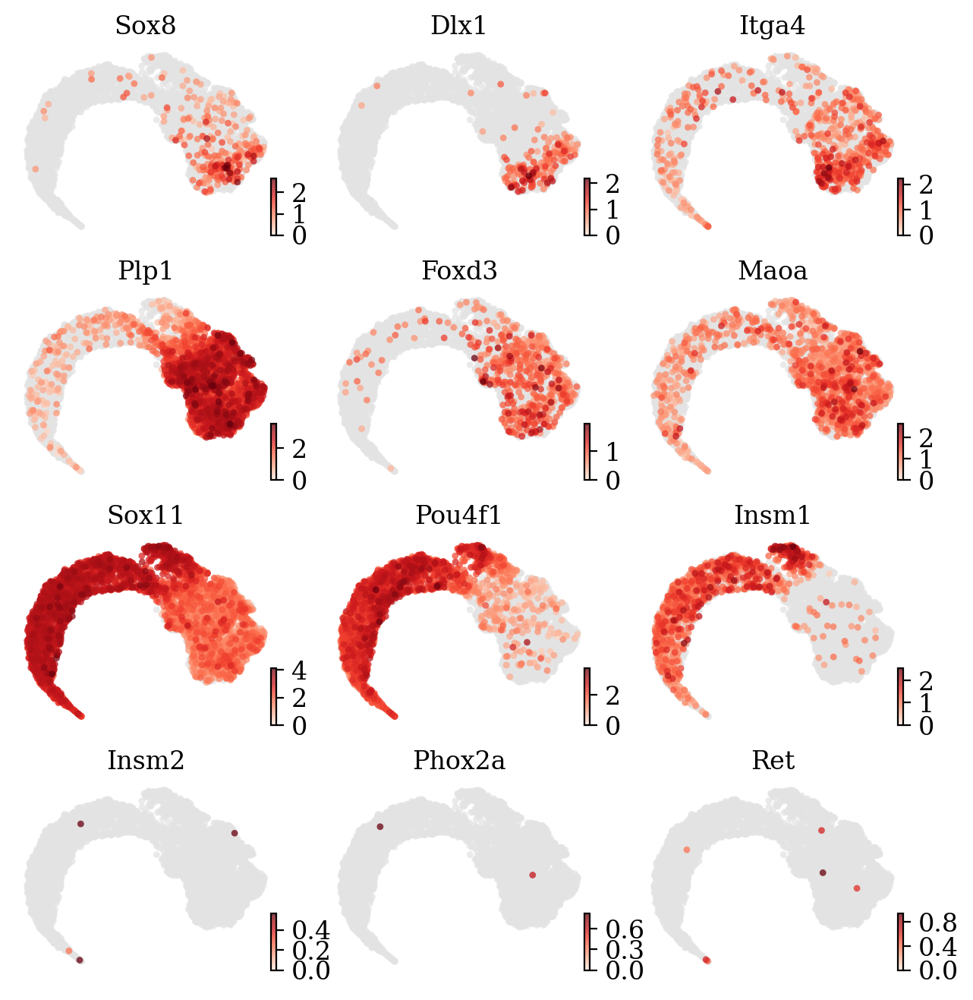

In [66]:
scv.pl.umap(adata_j_prev, color = extra_markers, color_map = reds_cmap, ncols = 3,
            frameon = False, size = 40, alpha = .75, figsize=(2.5, 2))


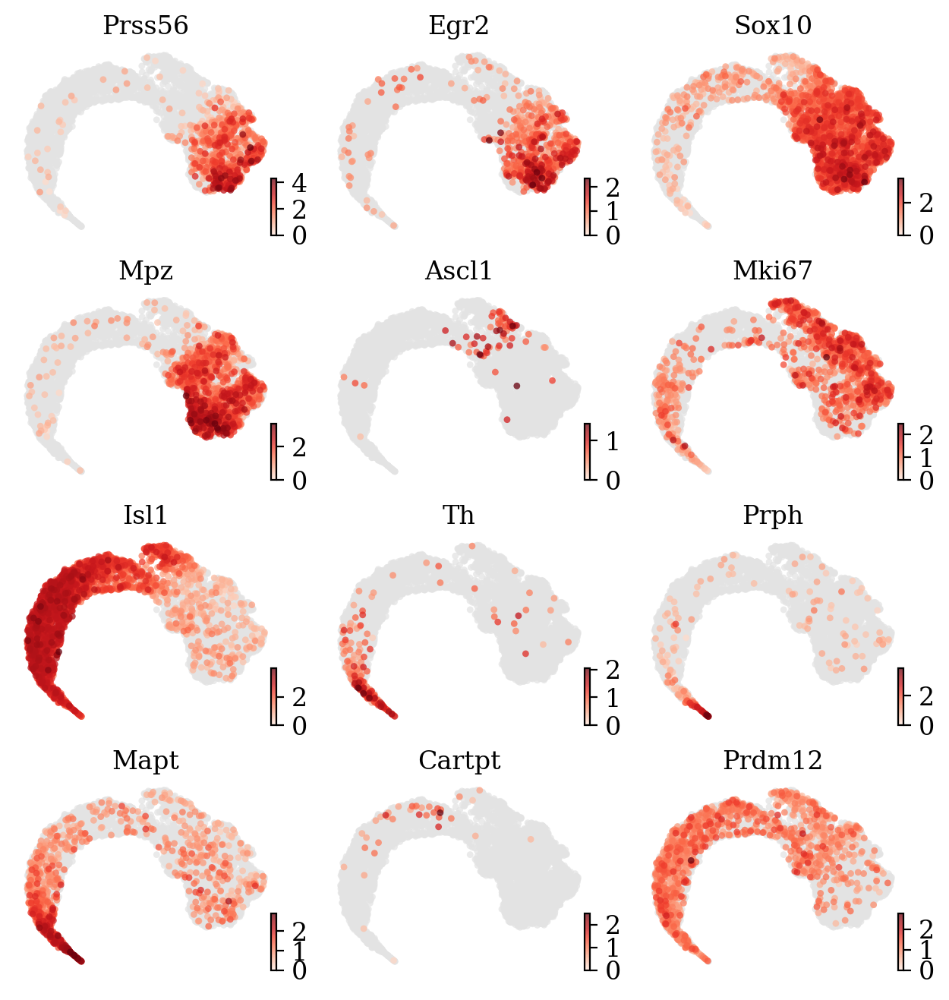

In [67]:
scv.pl.umap(adata_j_prev, color = markers_to_plot_ordered, color_map = reds_cmap, ncols = 3,
            frameon = False, size = 40, alpha = .75, figsize=(2.5, 2))


In [162]:
adata_j

AnnData object with n_obs × n_vars = 5127 × 33207
    obs: 'id', 'age', 'lineage', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'leiden', 'leiden_res_1.2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'age_colors', 'id_colors', 'leiden_res_1.2_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'scaled'
    obsp: 'distances', 'connectivities'

In [95]:
adata_j_velo = adata_j.copy()
#adata_j = adata_j[:, adata_j.var.highly_variable]

for layer in ["spliced", "unspliced", "ambiguous"]:
    sc.pp.normalize_total(adata_j_velo, layer=layer, target_sum=1e4)
    sc.pp.log1p(adata_j_velo, layer=layer)

In [96]:
scv.pp.moments(adata_j_velo, n_pcs=15, n_neighbors=30)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:05) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [97]:
scv.tl.recover_dynamics(adata_j_velo, n_jobs=16)
scv.tl.velocity(adata_j_velo, mode="dynamical")
scv.tl.velocity_graph(adata_j_velo)

recovering dynamics (using 16/32 cores)
    finished (0:02:39) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/32 cores)
    finished (0:00:12) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


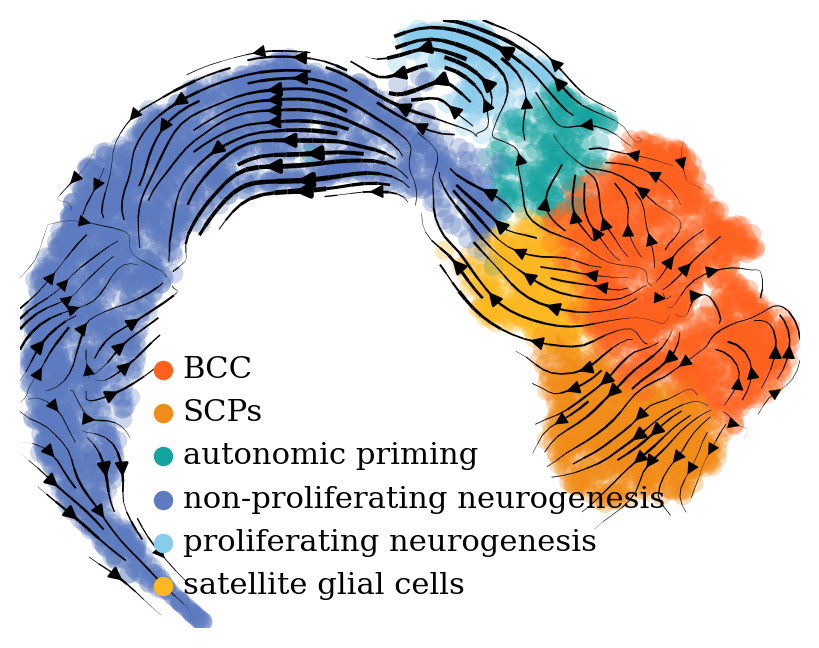

In [98]:
scv.pl.velocity_embedding_stream(adata_j_velo, basis="umap", size = 200, color = "celltype", legend_loc = "lower center", 
                                 title = "", figsize=(5, 4))

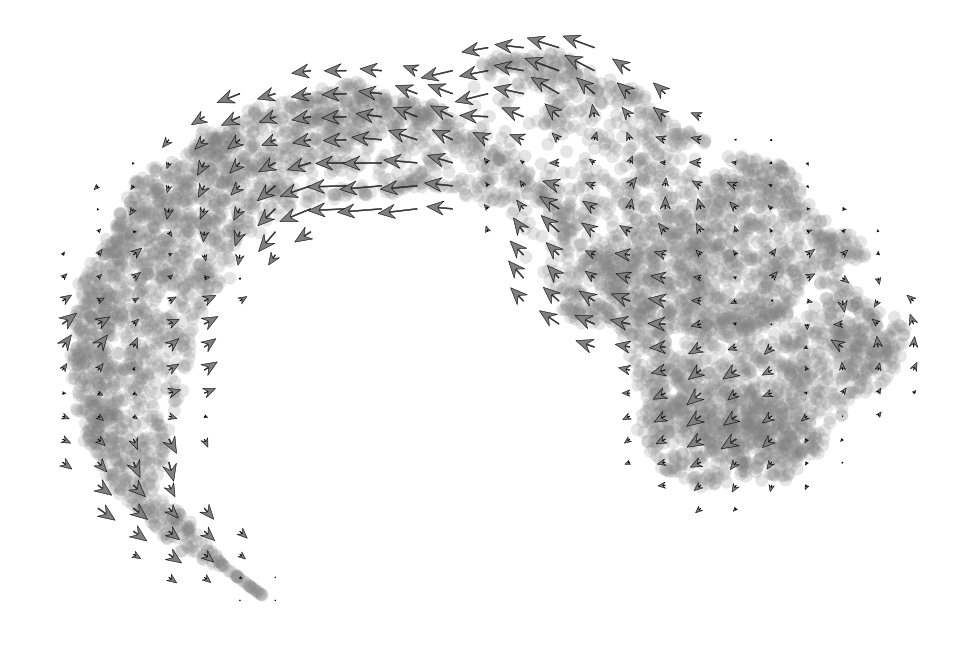

In [99]:
scv.pl.velocity_embedding_grid(adata_j_velo, basis="umap", density=0.5, arrow_length=2, arrow_size=3)

In [100]:
adata_j.uns["id_colors"] = ["red", "orange", "green"]

In [101]:
adata_j.obs.id.value_counts()

Egr2_E12.5      3122
Prss56_E12.5    1357
Egr2_E11.5       648
Name: id, dtype: int64

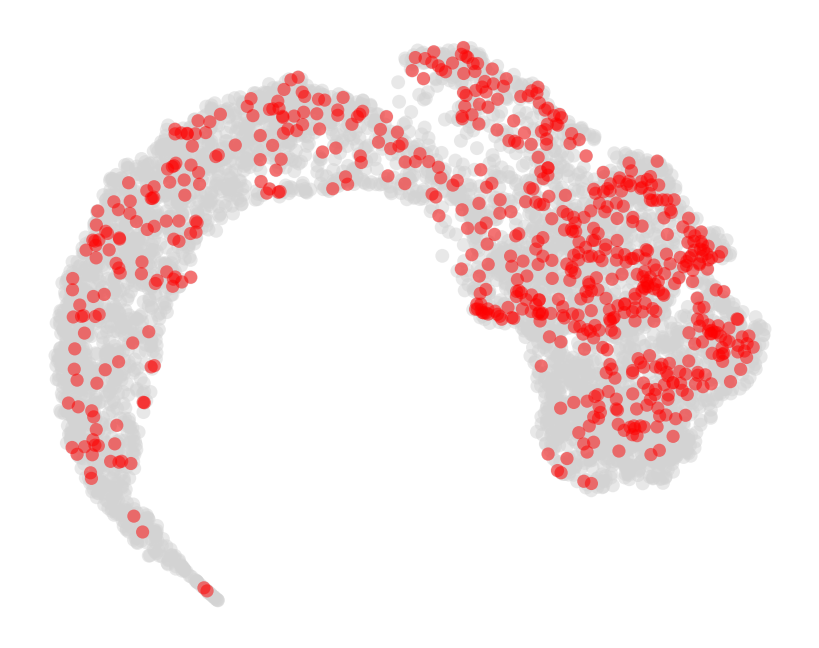

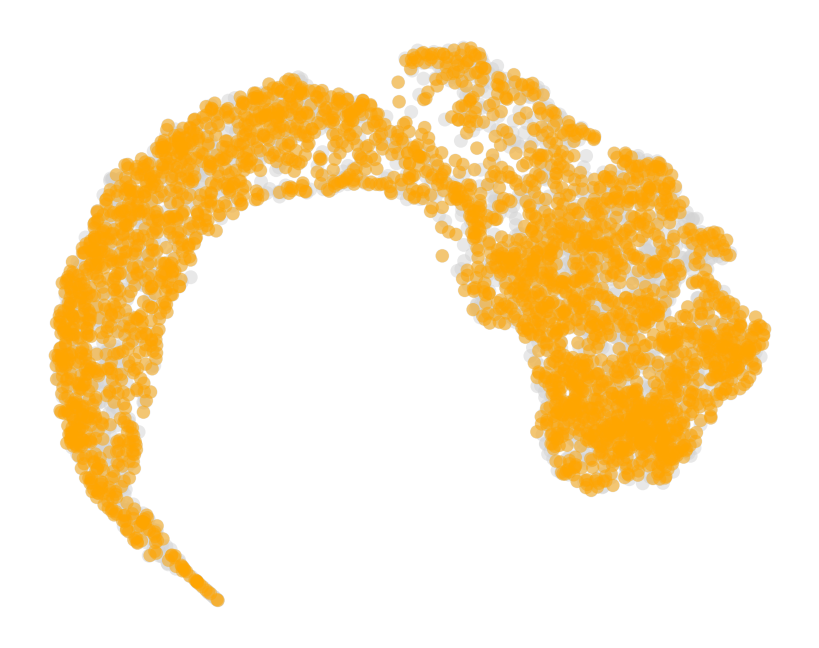

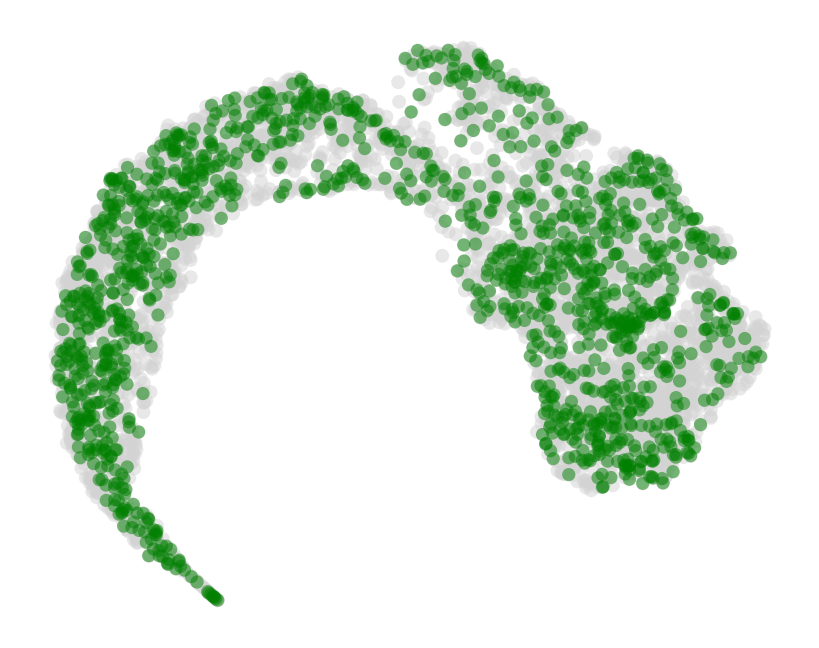

In [102]:
scv.pl.umap(adata_j,color="id",
           groups="Egr2_E11.5",alpha=0.5,s=90,
           legend_loc="none",title="", size = 100, figsize=(5, 4))
scv.pl.umap(adata_j,color="id",
           groups="Egr2_E12.5",alpha=0.5,s=90,
           legend_loc="none",title="", size = 100, figsize=(5, 4))
scv.pl.umap(adata_j,color="id",
           groups="Prss56_E12.5",s=90,alpha=0.5,
           legend_loc="none",title="", size = 100, figsize=(5, 4))

In [107]:
del adata_j_velo.raw
del adata_j.raw

In [119]:
sc.pp.filter_genes(adata_j, min_cells=2)
sc.pp.filter_genes(adata_j_velo, min_cells=2)

In [122]:
hvgs = adata_j_velo.var_names[adata_j_velo.var.highly_variable]
adata_j_velo = adata_j_velo[:, hvgs]

In [120]:
adata_j.write_h5ad("BCC_integrated.h5ad")

In [123]:
adata_j_velo.write_h5ad("BCC_integrated_velo.h5ad")

In [137]:
%pip list

Package                       Version
----------------------------- -----------
aiofiles                      22.1.0
aiosqlite                     0.18.0
anndata                       0.9.0
annoy                         1.17.3
anyio                         3.6.2
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
asttokens                     2.2.1
attrs                         22.2.0
Babel                         2.12.1
backcall                      0.2.0
backports.functools-lru-cache 1.6.4
beautifulsoup4                4.12.2
bleach                        6.0.0
Bottleneck                    1.3.7
brotlipy                      0.7.0
cached-property               1.5.2
certifi                       2024.2.2
cffi                          1.16.0
charset-normalizer            3.1.0
click                         8.1.7
colorama                      0.4.6
comm                          0.1.3
cryptography                  39.0.1
cycler                        0.11.0
Cython